In [23]:
import scanpy as sc
sc.settings.set_figure_params(dpi=100, fontsize=10, dpi_save=250, format='pdf')
import numpy as np
import pandas as pd
from scipy import io
from matplotlib.pyplot import rc_context
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings(action='ignore')
import seaborn as sns
%matplotlib inline
import colour_scheme as cs
from pathlib import Path

In [2]:
def read_sparse(fh):
    import pandas as pd
    import scanpy as sc
    import scipy
    from scipy import io
    df = io.mmread(fh+'count_matrix.mtx')
    df = scipy.sparse.csr_matrix(df)
    gene_names = pd.read_csv(fh+'all_genes.csv')
    cell_names = pd.read_csv(fh+'cell_metadata.csv')
    adata = sc.AnnData(df)
    adata.var_names = list(gene_names['gene_name'])
    adata.obs_names = list(cell_names['bc_wells'])
    adata.var_names_make_unique()
    return(adata)

In [ ]:
PATH_FILE = ''

In [4]:

fh = Path(PATH_FILE)/'all-sample/DGE_filtered/'
adata=read_sparse(fh)

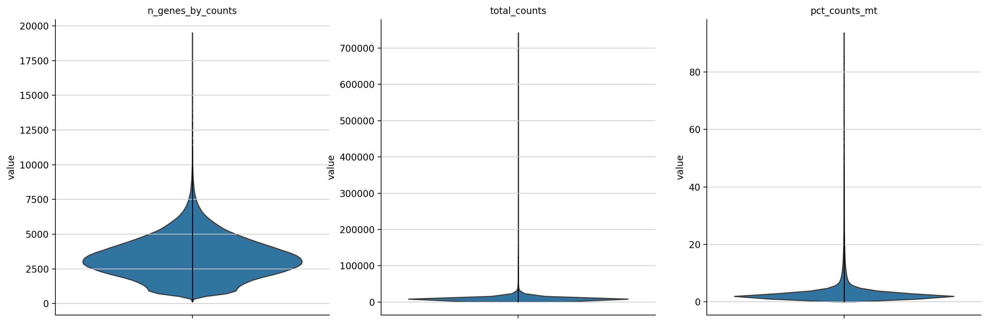

In [5]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.0, multi_panel=True)

In [6]:
adata

AnnData object with n_obs × n_vars = 233211 × 62710
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [7]:
adata = adata[adata.obs.total_counts > 750,:]
adata =adata[adata.obs.total_counts < 20000,:]
adata =adata[adata.obs.pct_counts_mt < 10,:]


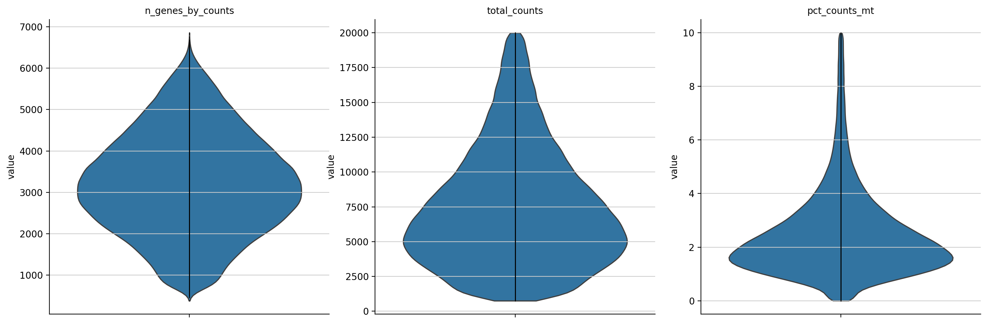

View of AnnData object with n_obs × n_vars = 214059 × 62710
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [8]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0, multi_panel=True)
adata

In [9]:
sc.pp.filter_genes(adata, min_cells=5)
adata

AnnData object with n_obs × n_vars = 214059 × 43558
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

In [10]:
adata.obs.head()

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
01_01_21__s1,2600,4652,68,1.461737
01_01_23__s1,1617,2499,54,2.160864
01_01_26__s1,5209,15899,187,1.176175
01_01_31__s1,3877,9904,149,1.504443
01_01_38__s1,4375,9521,165,1.733011


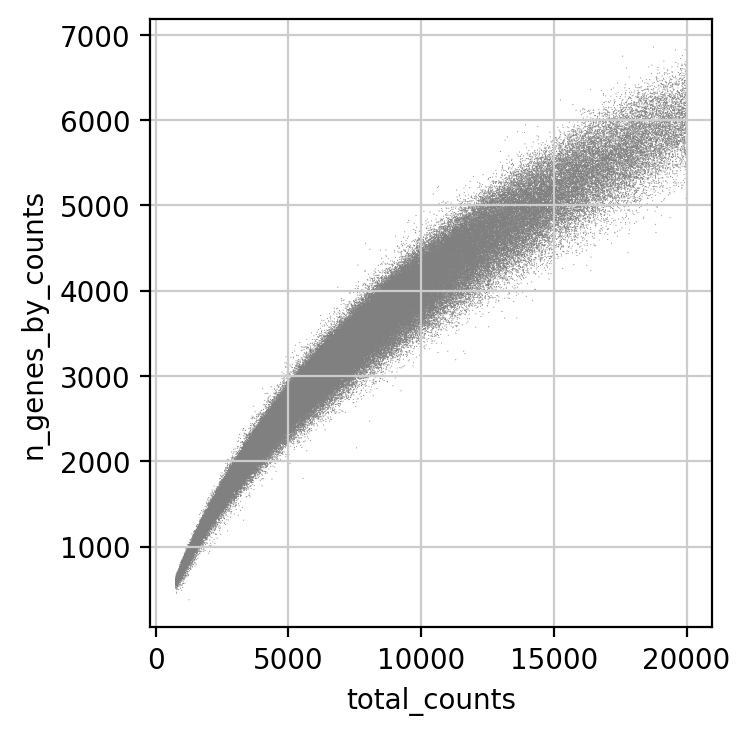

median transcript count per cell: 6702.0
median gene count per cell: 3174.0


In [11]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
print('median transcript count per cell: ' + str(adata.obs['total_counts'].median(0)))
print('median gene count per cell: ' + str(adata.obs['n_genes_by_counts'].median(0)))

In [12]:
adata.obs['sample'] = adata.obs.index
adata.obs[['sample','lib']] = adata.obs['sample'].str.split('__', expand=True) 
adata.obs['sample'] = adata.obs['sample'].str.split('_').str[0] 

adata.obs['lib'].value_counts()

lib
s2    56771
s4    56162
s3    51655
s1    49471
Name: count, dtype: int64

In [13]:
adata.obs['original_name'] = adata.obs.index.copy()

In [16]:
meta = pd.read_csv('metadata_parse.csv', dtype={"sample":"string"})
#meta = meta.rename({"Ssmple":"sample"}, axis=1)
meta.head()

,sample,condition,condition_name_full,cell_line_1,cell_line_2,batch,medium,morphogen,morphogen_full
0,01,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl
1,02,2,B1_NIM_SHH_A,H1 plate 1,H9 plate 1,B1,NIM,SHH,SHH_A
2,03,3,B1_NIM_SHH_E,H1 plate 1,H9 plate 1,B1,NIM,SHH,SHH_E
3,04,4,B1_NIM_RA_A,H1 plate 1,H9 plate 1,B1,NIM,RA,RA_A
4,05,5,B1_NIM_RA_E,H1 plate 1,H9 plate 1,B1,NIM,RA,RA_E


In [17]:
adata.obs = adata.obs.merge(meta, how='left', on='sample',validate="many_to_one")

In [18]:
adata.obs.index = adata.obs.original_name
adata.obs.head()

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,sample,lib,original_name,condition,condition_name_full,cell_line_1,cell_line_2,batch,medium,morphogen,morphogen_full
original_name,,,,,,,,,,,,,,,
01_01_21__s1,2600,4652,68,1.461737,01,s1,01_01_21__s1,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl
01_01_23__s1,1617,2499,54,2.160864,01,s1,01_01_23__s1,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl
01_01_26__s1,5209,15899,187,1.176175,01,s1,01_01_26__s1,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl
01_01_31__s1,3877,9904,149,1.504443,01,s1,01_01_31__s1,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl
01_01_38__s1,4375,9521,165,1.733011,01,s1,01_01_38__s1,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl


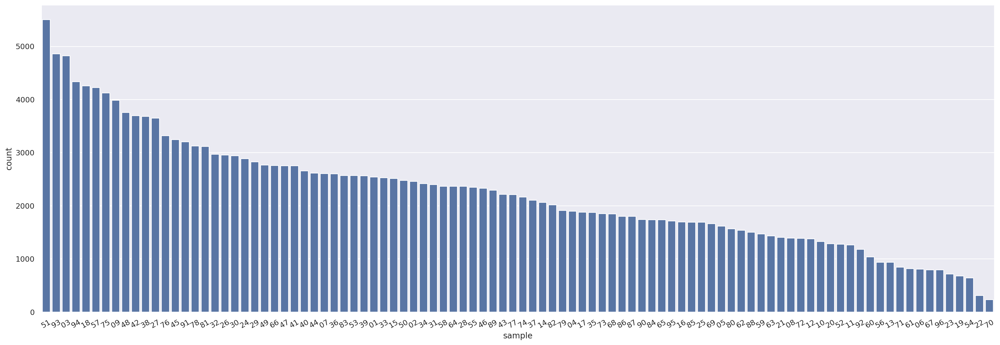

In [19]:
sns.set_theme(rc={'figure.figsize':(25,8.27)})
sns.barplot(adata.obs['sample'].value_counts())
plt.xticks(rotation=30)
plt.show()

In [20]:
adata.write(Path(PATH_FILE)/'exp1_raw.h5ad')

In [39]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata 
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata = adata[:, adata.var.highly_variable]

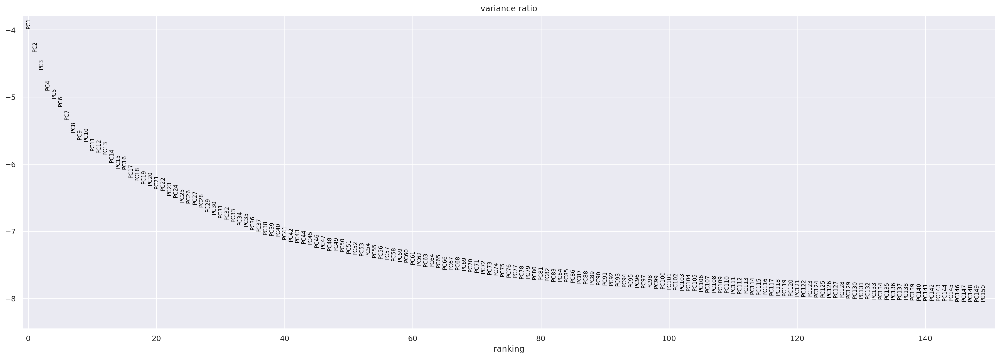

In [40]:

sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'],n_jobs=5)

sc.pp.scale(adata, max_value=10)

sc.tl.pca(adata, svd_solver='arpack',n_comps=150)
sc.pl.pca_variance_ratio(adata, log=True,n_pcs=150)

In [41]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=60)

sc.tl.umap(adata)

In [67]:
adata.obs = adata.obs.drop(['condition_name_full',	'cell_line_1',	'cell_line_2',	'batch',	'medium',	'morphogen',	'morphogen_full'], axis=1)

In [71]:
meta = pd.read_csv('metadata_parse.csv', dtype={"sample":"string"})

In [72]:
adata.obs = adata.obs.merge(meta, how='left', on='sample',validate="many_to_one")

In [73]:
adata.obs.head()

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,sample,lib,original_name,condition _x,condition _y,condition_name_full,cell_line_1,cell_line_2,batch,medium,morphogen,morphogen_full
0,2600,4652,68,1.461737,01,s1,01_01_21__s1,1,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl
1,1617,2499,54,2.160864,01,s1,01_01_23__s1,1,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl
2,5209,15899,187,1.176175,01,s1,01_01_26__s1,1,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl
3,3877,9904,149,1.504443,01,s1,01_01_31__s1,1,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl
4,4375,9521,165,1.733011,01,s1,01_01_38__s1,1,1,B1_NIM_Ctrl,H1 plate 1,H9 plate 1,B1,NIM,Ctrl,Ctrl


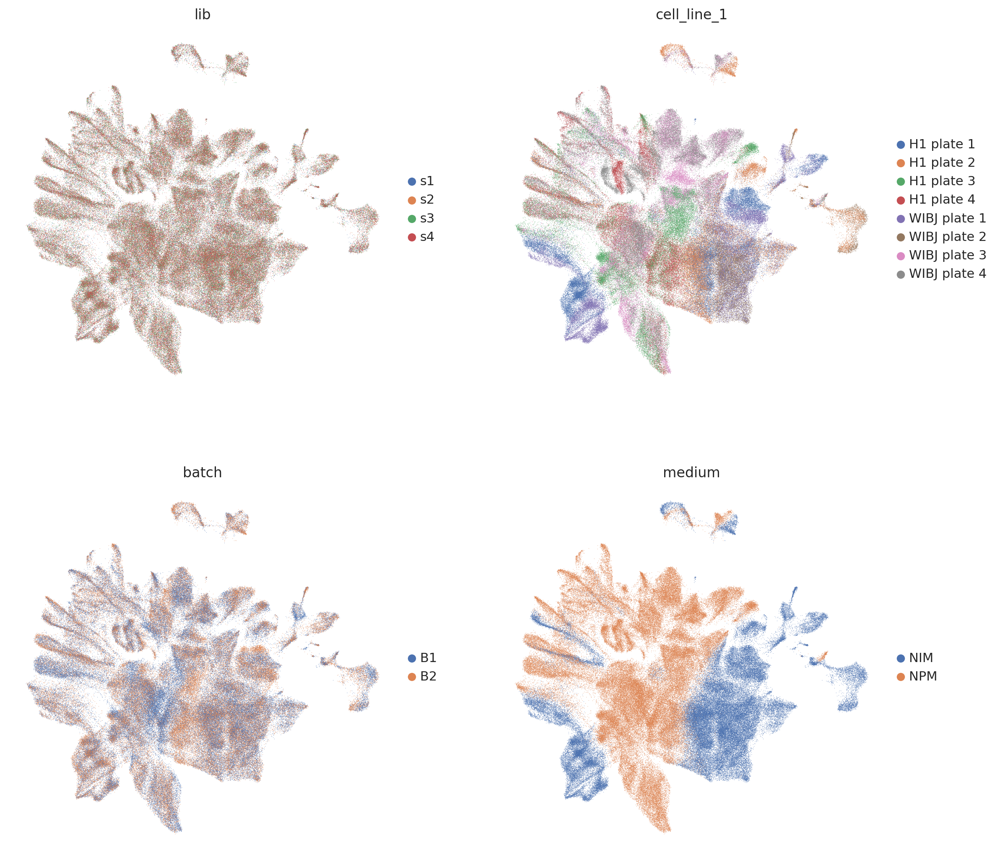

In [74]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata, color=["lib","cell_line_1","batch", "medium"] , frameon=False,
              ncols =2)

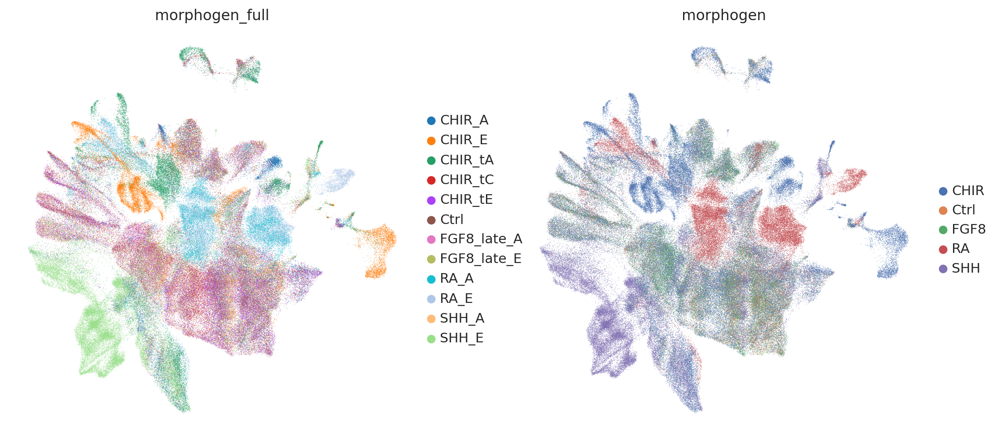

In [50]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata, color=["morphogen_full", "morphogen"] , frameon=False,
              ncols =2)

In [83]:
def plot_separately(adata, col_name, save=False, s=1, palette=None):
    # Save is by default False, otherwise - pathname to save fig
    # s - dot size
    # Get unique categories
    unique_categories = np.array(adata.obs[col_name].unique().tolist()).astype(str)
    unique_categories = [x for x in unique_categories if x != 'nan']
    unique_categories = [x for x in unique_categories if x != 'No']

    nrows = int(np.ceil(len(unique_categories) / 3))
    
    # Set up the subplots
    fig, axes = plt.subplots(nrows, 3, figsize=(15, 5 * nrows))
    
    # Loop through each category and create a UMAP plot
    for i, category in enumerate(unique_categories):
        if nrows == 1:
            ax = axes[i]
        else:
            colpos = i % 3
            rowpos = i // 3
            ax = axes[rowpos, colpos]
        
        # Filter data for the current category
        category_data = adata[adata.obs[col_name] == category, :]
        
        # Plot all other cells in grey
        other_data = adata[adata.obs[col_name] != category, :]
        ax.scatter(other_data.obsm['X_umap'][:, 0], other_data.obsm['X_umap'][:, 1], 
                   color='lightgrey', s=s, alpha=0.5)
        
        # Plot the UMAP for the selected category in color
        if palette is None:
            sc.pl.umap(category_data, color=col_name, ax=ax, show=False, 
                       frameon=False, size=s + 1, legend_loc=None)
        else:
            sc.pl.umap(category_data, color=col_name, ax=ax, show=False, 
                       frameon=False, size=s + 1, legend_loc=None, palette=palette)
        
        ax.set_title(f'{category}')
        
        # Turn off grid and axis for empty subplots
        if not category_data.shape[0]:
            ax.set_axis_off()

    # Adjust layout
    plt.tight_layout()
    
    # Save the plot if a save path is provided
    if save:
        plt.savefig(save, dpi=300)

    plt.show()


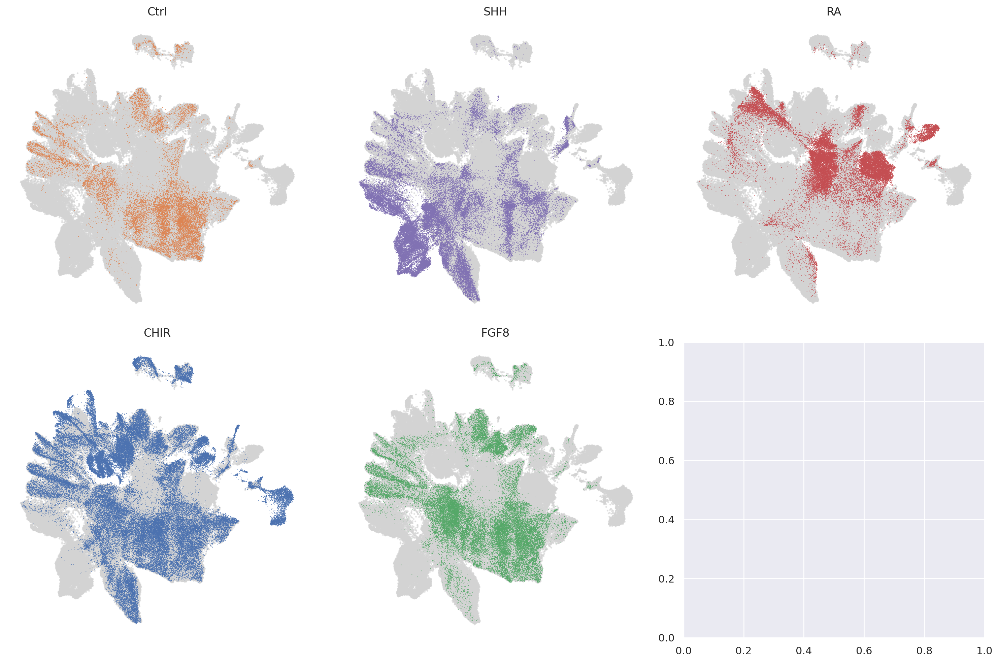

In [53]:
plot_separately(adata, "morphogen")

In [85]:
adata.obs['Batch_Medium'] = adata.obs['batch'].astype(str) + '_' + adata.obs['medium'].astype(str)

#adata.obs['Batch_Medium'] = adata.obs['Batch_Medium']

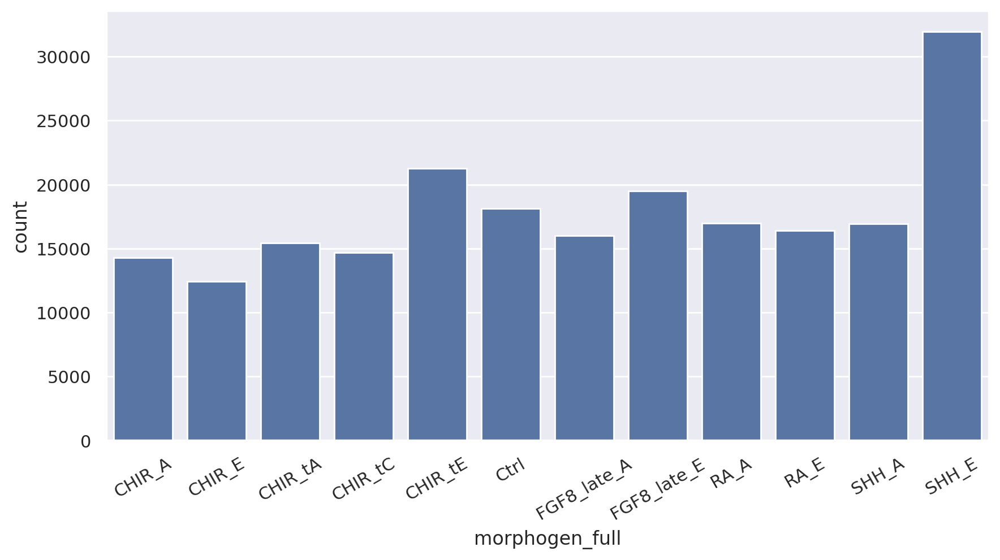

In [92]:
sns.set_theme(rc={'figure.figsize':(10,5)})


sns.barplot(adata.obs['morphogen_full'].value_counts())
plt.xticks(rotation=30)
plt.show()

In [94]:
adata.obs['medium_morphogen'] = adata.obs['morphogen_full'].astype(str) + '_' + adata.obs['medium'].astype(str)

In [96]:
sc.tl.leiden(adata)

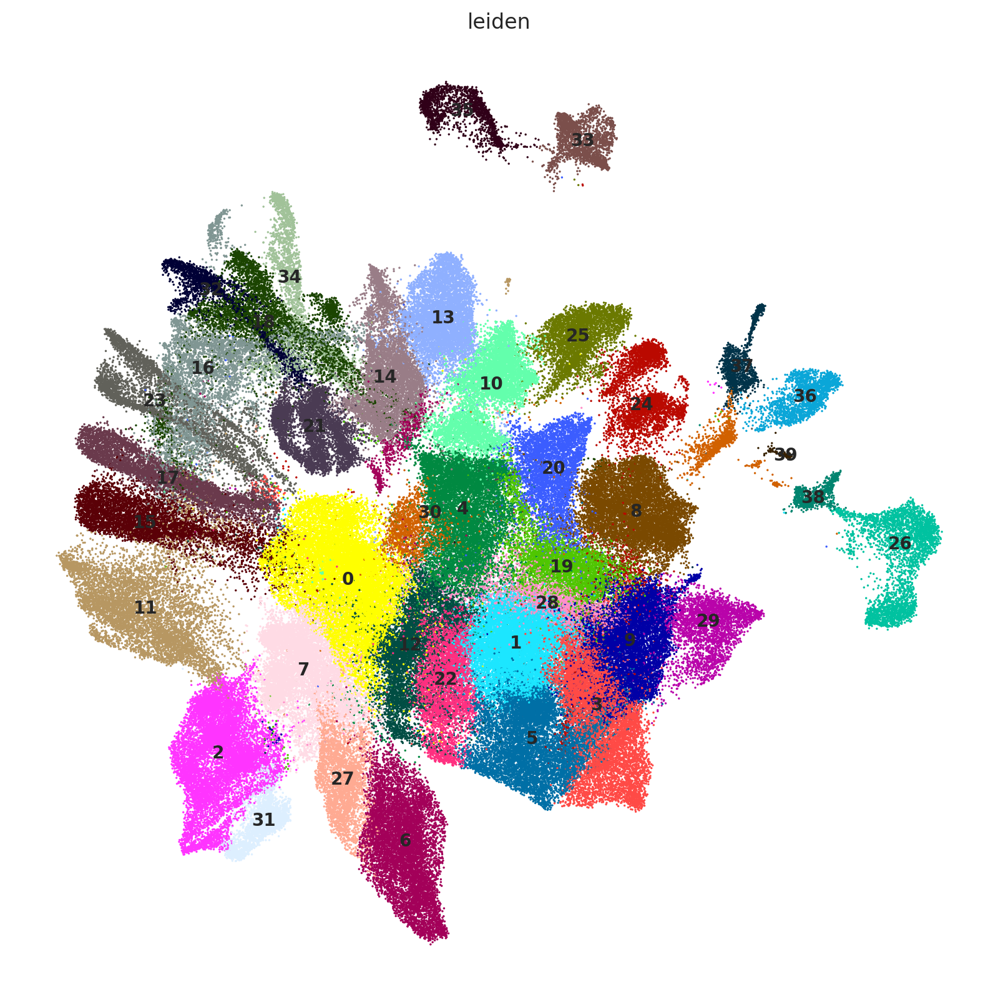

In [97]:
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color=['leiden'], frameon=False,legend_loc='on data',legend_fontsize=10,s=6)

In [98]:
adata.write(Path(PATH_FILE)/'exp1_processed.h5ad')

# write barcodes for demultiplxing cell lines vireo

In [102]:
#WTC/WIBJ

df = adata.obs[adata.obs.cell_line_1.str.startswith('WIBJ')].copy()
barcodes = df.original_name.tolist()
with open(Path(PATH_FILE)/'for_vireo/barcode_WIBJ_WTC.lis', 'w') as f:
    for item in barcodes:
        f.write("%s\n" % item)


In [104]:
#H1 H9

df = adata.obs[adata.obs.cell_line_1.str.startswith('H1')].copy()
barcodes = df.original_name.tolist()
with open(Path(PATH_FILE)/'for_vireo/barcode_H9_H1.lis', 'w') as f:
    for item in barcodes:
        f.write("%s\n" % item)
